# `MetaKGPathFinder` Testing

`MetaKGPathFinder` is a package designed to use the `ConsolidatedMetaKG` index to provide a list of available paths between a source `subject` and target `object`.  
  
  

In [3]:
from utils.metakg import path_finder
import pprint
import warnings
warnings.filterwarnings('ignore')


Set up test data

In [4]:
# query filter to find BTE data only
query_data = {
    'q': 'api.name:BTE'
}

In [5]:
from utils.metakg import path_finder
pf = path_finder.MetaKGPathFinder(query_data)

Lets get the graph `G`

In [6]:
G = pf.G

In [7]:
G

In [7]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()


In [8]:
num_nodes

43

In [9]:
nodes = list(G.nodes())
# edges = list(G.edges(data=True))


In [9]:
degrees = dict(G.degree())
degrees

{'SmallMolecule': 67,
 'PopulationOfIndividualOrganisms': 42,
 'PhysiologicalProcess': 56,
 'Procedure': 56,
 'ChemicalEntity': 62,
 'ClinicalAttribute': 40,
 'Annotation': 40,
 'Publication': 42,
 'ComplexMolecularMixture': 44,
 'BiologicalProcess': 47,
 'MolecularMixture': 48,
 'Device': 26,
 'Drug': 47,
 'Disease': 66,
 'PhenotypicFeature': 53,
 'ChemicalExposure': 44,
 'EnvironmentalExposure': 44,
 'ClinicalIntervention': 40,
 'InformationContentEntity': 44,
 'Activity': 44,
 'Protein': 58,
 'Gene': 67,
 'AnatomicalEntity': 13,
 'Cell': 25,
 'CellularComponent': 29,
 'GrossAnatomicalStructure': 29,
 'DiseaseOrPhenotypicFeature': 5,
 'MolecularActivity': 24,
 'SequenceVariant': 7,
 'Polypeptide': 30,
 'PathologicalProcess': 30,
 'ClinicalFinding': 6,
 'Pathway': 15,
 'Food': 6,
 'ChemicalMixture': 6,
 'Phenomenon': 2,
 'Behavior': 5,
 'GeneticInheritance': 1,
 'OrganismTaxon': 6,
 'Treatment': 2,
 'GeneFamily': 8,
 'BiologicalEntity': 2,
 'OrganismAttribute': 2}

Lets see the predicate list associated with the graph

In [10]:
pf.predicates

{'SmallMolecule-PopulationOfIndividualOrganisms': [{'predicate': 'correlated_with',
   'api': [{'name': 'Automat-icees-kg(Trapi v1.3.0)',
     'smartapi': {'metadata': 'https://trapi-openapi.apps.renci.org/trapi/infores:automat-icees-kg/1.3.0',
      'id': '44e7a1147ca8657f50af6bb25982762d',
      'ui': 'https://smart-api.info/ui/44e7a1147ca8657f50af6bb25982762d'},
     'tags': ['translator', 'automat', 'trapi', 'bte-trapi'],
     'x-translator': {'component': 'KP', 'team': ['Exposures Provider']},
     'bte': {'query_operation': {'path': '/query',
       'method': 'post',
       'server': 'https://automat.transltr.io/icees-kg/1.3',
       'path_params': None,
       'params': None,
       'request_body': None,
       'support_batch': True,
       'input_separator': ','}}},
    {'name': 'BioThings Explorer (BTE) TRAPI',
     'smartapi': {'metadata': 'https://raw.githubusercontent.com/NCATS-Tangerine/translator-api-registry/master/biothings_explorer/smartapi.yaml',
      'id': 'dc91716f

Testing the `get_paths()` method. This method requires an `subject` & `object` and an optional `cutoff` value (default, `cutoff=3`)

In [11]:
subject="ComplexMolecularMixture"
object="DiseaseOrPhenotypicFeature"
cutoff=3

In [12]:
paths = pf.get_paths(subject=subject, object=object, cutoff=cutoff)


Inspect output

The output of `get_paths` is a list of dictionaries that contain keys `path` and  `edges`.    
- `path` is the full path. It is represented as a `list` of `str` values that represent the nodes, starting from the requested subject node, to the object node.  
- `edges` is a `list` of `dict`. The dictionaries contain keys, `subject` and `object` which are `str` values, representing a path, and the `predicates` key is a list of predicates available between the path.

In [13]:
type(paths)

list

In [14]:
len(paths)

83

In [15]:
example_path = paths[0]

In [16]:
pprint.pprint(example_path)

{'edges': [{'api': [{'bte': {'query_operation': {'input_separator': ',',
                                                 'method': 'post',
                                                 'params': None,
                                                 'path': '/query',
                                                 'path_params': None,
                                                 'request_body': None,
                                                 'server': 'https://automat.transltr.io/icees-kg/1.3',
                                                 'support_batch': True}},
                     'name': 'Automat-icees-kg(Trapi v1.3.0)',
                     'smartapi': {'id': '44e7a1147ca8657f50af6bb25982762d',
                                  'metadata': 'https://trapi-openapi.apps.renci.org/trapi/infores:automat-icees-kg/1.3.0',
                                  'ui': 'https://smart-api.info/ui/44e7a1147ca8657f50af6bb25982762d'},
                     'tags': ['translator', '

VIEW PATH NODES

In [17]:
for i, node in enumerate(example_path['path']):
    print("Node %s: "%i, node)

Node 0:  ComplexMolecularMixture
Node 1:  SmallMolecule
Node 2:  ChemicalEntity
Node 3:  DiseaseOrPhenotypicFeature


VIEW EDGES

In [18]:
# print(" -> ".join(example_path['path']))
# for i, edge in enumerate(example_path['edges']):
#     print(f"Part {i}: {edge['subject']} --> {edge['object']}")
#     print(f"API for predicate: {edge['predicate']} \n {edge['api']}")

Test expected nodes are in graph `G`

In [19]:
len(pf.G.nodes)

43

In [20]:
query_data

{'q': 'api.name:BTE'}

---

We pass this index name to the MetaKG controller, `controller.metakg`, so we reference the `consolidated` index.

In [21]:
from controller.metakg import MetaKG
from model import ConsolidatedMetaKGDoc


In [22]:
index = ConsolidatedMetaKGDoc.Index.name

Test that all nodes that exist in the index exist in the networkx graph `G`

In [23]:
unique_index_nodes = set()

In [24]:
for data_doc in MetaKG.get_all_via_scan(query_data=query_data, index=index):
    sub = data_doc['_source']['subject']
    obj = data_doc['_source']['object']
    unique_index_nodes.add(sub)
    unique_index_nodes.add(obj)
    

In [25]:
len(unique_index_nodes)

43

In [26]:
for node in list(unique_index_nodes):
    assert node in pf.G.nodes()

---

In [27]:
import networkx as nx
import matplotlib.pyplot as plt


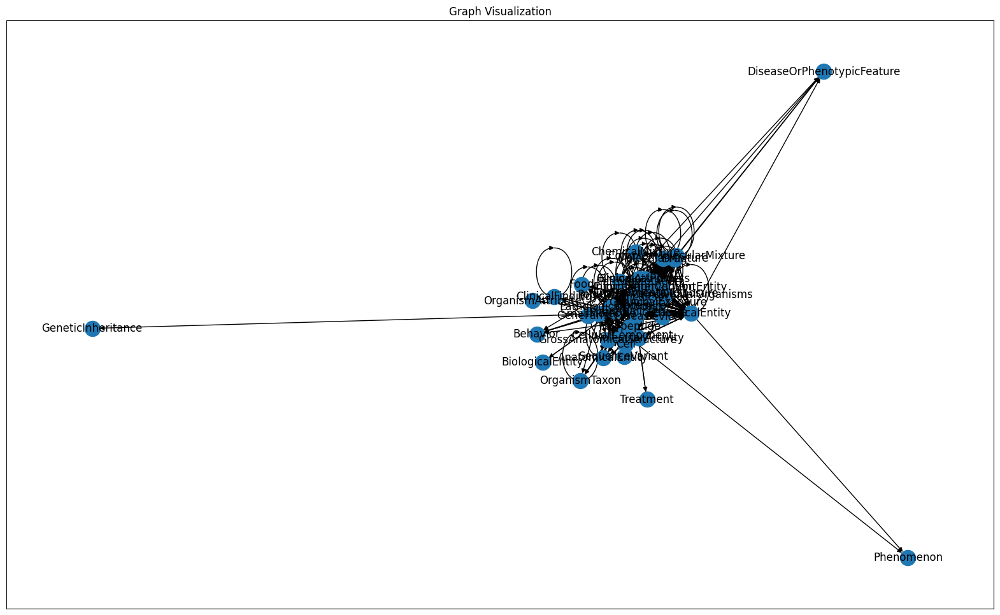

In [28]:
def plot_graph(graph):
    plt.figure(figsize=(20, 12))

    # Draw the graph
    pos = nx.spring_layout(graph)  # positions for all nodes, you can try other layouts as well
    nx.draw_networkx_nodes(graph, pos)
    nx.draw_networkx_edges(graph, pos)
    nx.draw_networkx_labels(graph, pos)

    plt.title("Graph Visualization")
    plt.show()

plot_graph(pf.G)


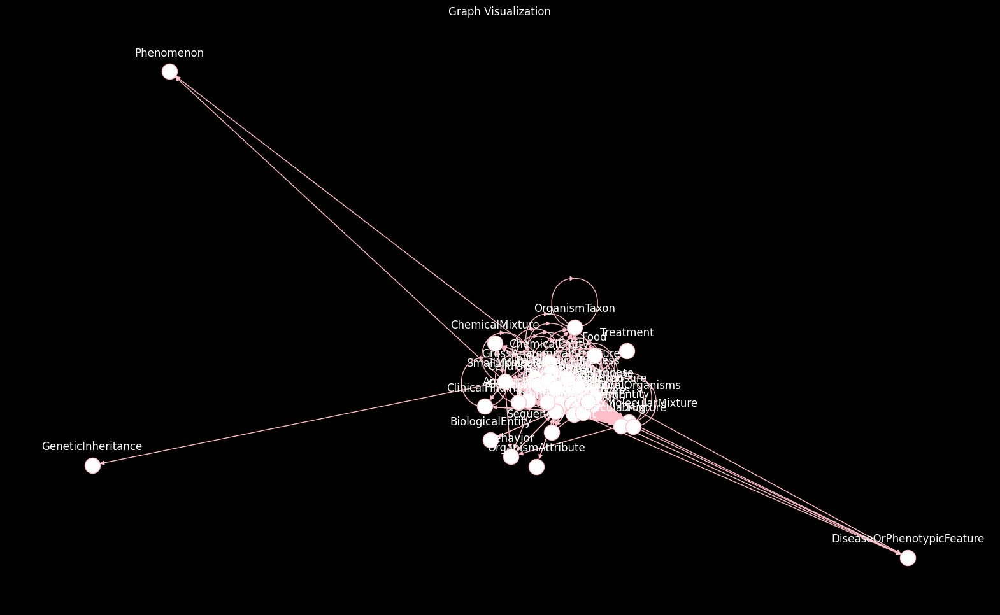

In [33]:
import matplotlib.pyplot as plt
import networkx as nx

def plot_graph(graph):
    # Create a figure with a black background
    fig = plt.figure(figsize=(20, 12), facecolor='black')
    
    pos = nx.spring_layout(graph)  # positions for all nodes
    
    # Draw nodes with white color and pink edgecolor
    nx.draw_networkx_nodes(graph, pos, node_color='white', edgecolors='pink', linewidths=1)
    
    # Draw edges with pink color
    nx.draw_networkx_edges(graph, pos, edge_color='pink')
    
    # Adjusting positions for labels to be slightly off from the nodes
    label_pos = {key: (value[0], value[1] + 0.05) for key, value in pos.items()}
    
    # Draw labels with white color
    nx.draw_networkx_labels(graph, label_pos, font_color='white')

    plt.title("Graph Visualization", color='white')
    plt.axis('off')  # Turn off the axis
    
    # Set the current axis background color to black
    plt.gca().set_facecolor('black')
    
    plt.show()

# Assuming pf.G is your graph
plot_graph(pf.G)


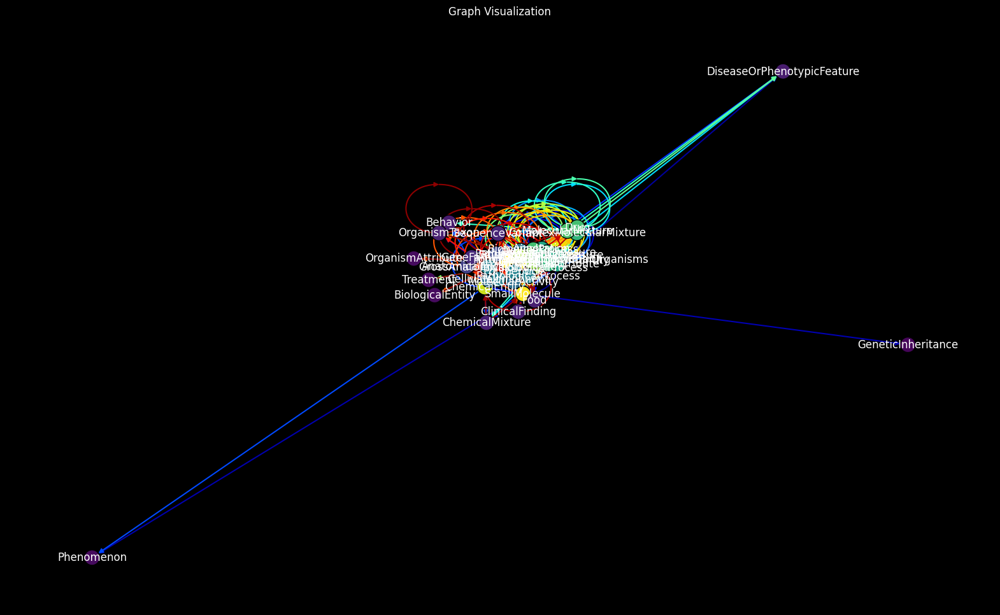

In [31]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

def plot_graph(graph):
    # Create a figure with a black background
    fig = plt.figure(figsize=(20, 12), facecolor='black')
    
    pos = nx.spring_layout(graph)
    
    # Node colors based on degree
    degrees = [deg for node, deg in graph.degree()]
    node_colors = plt.cm.viridis(np.linspace(0, 1, max(degrees) + 1))[degrees]
    
    # Edge colors based on weight (assuming weights, otherwise generate random colors)
    if nx.is_weighted(graph):
        weights = [graph[u][v]['weight'] for u, v in graph.edges()]
        max_weight = max(weights)
        edge_colors = plt.cm.inferno(np.linspace(0, 1, max_weight + 1))[weights]
    else:
        edge_colors = plt.cm.jet(np.linspace(0, 1, len(graph.edges())))

    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, edgecolors='black')
    nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, width=1.5)
    nx.draw_networkx_labels(graph, pos, font_color='white')
    
    plt.title("Graph Visualization", color='white')
    plt.axis('off')  
    plt.gca().set_facecolor('black')
    plt.show()

# Assuming pf.G is your graph
plot_graph(pf.G)


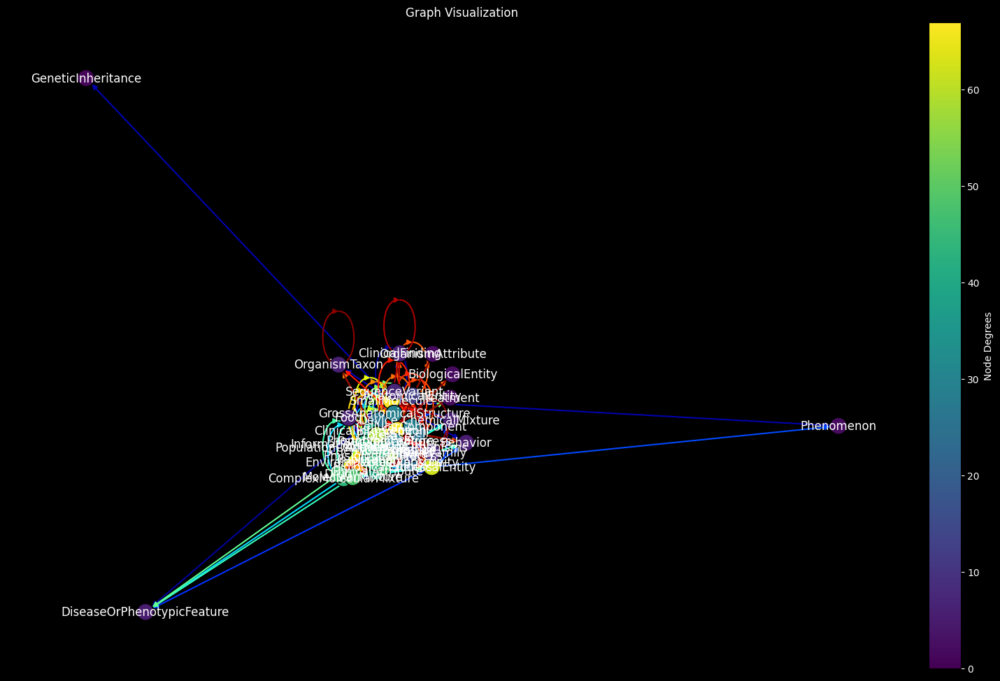

In [34]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np

def plot_graph(graph):
    # Create a figure with a black background
    fig, ax = plt.subplots(figsize=(20, 12), facecolor='black')
    
    pos = nx.spring_layout(graph)
    
    # Node colors based on degree
    degrees = [deg for node, deg in graph.degree()]
    node_colors = plt.cm.viridis(np.linspace(0, 1, max(degrees) + 1))[degrees]
    
    # Edge colors based on weight (assuming weights, otherwise generate random colors)
    if nx.is_weighted(graph):
        weights = [graph[u][v]['weight'] for u, v in graph.edges()]
        max_weight = max(weights)
        edge_colors = plt.cm.inferno(np.linspace(0, 1, max_weight + 1))[weights]
    else:
        edge_colors = plt.cm.jet(np.linspace(0, 1, len(graph.edges())))

    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, edgecolors='black', ax=ax)
    nx.draw_networkx_edges(graph, pos, edge_color=edge_colors, width=1.5, ax=ax)
    nx.draw_networkx_labels(graph, pos, font_color='white', ax=ax)
    
    # Node color legend
    sm_nodes = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=max(degrees)))
    sm_nodes.set_array([])
    cbar_nodes = plt.colorbar(sm_nodes, ax=ax, orientation='vertical', pad=0.01)
    cbar_nodes.set_label('Node Degrees', color='white')
    cbar_nodes.ax.yaxis.set_tick_params(color='white')
    plt.setp(plt.getp(cbar_nodes.ax.axes, 'yticklabels'), color='white')
    
    # Edge color legend if graph is weighted
    if nx.is_weighted(graph):
        sm_edges = plt.cm.ScalarMappable(cmap=plt.cm.inferno, norm=plt.Normalize(vmin=0, vmax=max_weight))
        sm_edges.set_array([])
        cbar_edges = plt.colorbar(sm_edges, ax=ax, orientation='vertical', pad=0.06)
        cbar_edges.set_label('Edge Weights', color='white')
        cbar_edges.ax.yaxis.set_tick_params(color='white')
        plt.setp(plt.getp(cbar_edges.ax.axes, 'yticklabels'), color='white')

    plt.title("Graph Visualization", color='white')
    ax.set_axis_off()
    plt.show()

# Assuming pf.G is your graph
plot_graph(pf.G)


Test `get_paths`

In [113]:
paths = pf.get_paths(subject=subject, object=object, cutoff=2)
# For the above mock data, you should expect a path ["A", "B", "C"]

In [114]:
for data in paths[:2]:
    print()
    # print(data.keys())
    print(f"> Path: {' -> '.join(data['path'])}")
    for edge in data['edges']:
        print(f"\n\tInner Path: {edge['subject']} -> {edge['object']}, predicate: {edge['predicate']}, API Count: {len(edge['api'])}")
        for api in edge['api']:
            print(f"\t\tapi.name: {api['name']}")
            # pprint.pprint(edge['api'])

    print()
    pprint.pprint(data)



> Path: ComplexMolecularMixture -> SmallMolecule -> DiseaseOrPhenotypicFeature

	Inner Path: ComplexMolecularMixture -> SmallMolecule, predicate: correlated_with, API Count: 3
		api.name: Automat-icees-kg(Trapi v1.3.0)
		api.name: Explanatory Agent API
		api.name: BioThings Explorer (BTE) TRAPI

	Inner Path: SmallMolecule -> DiseaseOrPhenotypicFeature, predicate: ameliorates, API Count: 3
		api.name: MolePro
		api.name: Explanatory Agent API
		api.name: BioThings Explorer (BTE) TRAPI

	Inner Path: SmallMolecule -> DiseaseOrPhenotypicFeature, predicate: treats, API Count: 6
		api.name: MolePro
		api.name: Explanatory Agent API
		api.name: RTX KG2 - TRAPI 1.3.0
		api.name: BioThings Explorer (BTE) TRAPI
		api.name: RTX KG2
		api.name: ARAX Translator Reasoner - TRAPI 1.3.0

{'edges': [{'api': [{'bte': {'query_operation': {'input_separator': ',',
                                                 'method': 'post',
                                                 'params': None,
           

In [115]:
def print_structure(d, indent=0):
    """Print the structure of a nested dictionary."""
    if isinstance(d, dict):
        for key, value in d.items():
            print('  ' * indent + str(key))
            print_structure(value, indent + 1)
    elif isinstance(d, list):
        print('  ' * indent + '[list]')
        if d and isinstance(d[0], (dict, list)):
            print_structure(d[0], indent + 1)
    else:
        print('  ' * indent + '[value]')

In [116]:
print_structure(paths)

[list]
  path
    [list]
  edges
    [list]
      subject
        [value]
      object
        [value]
      predicate
        [value]
      api
        [list]
          name
            [value]
          smartapi
            metadata
              [value]
            id
              [value]
            ui
              [value]
          tags
            [list]
          x-translator
            component
              [value]
            team
              [list]
          bte
            query_operation
              path
                [value]
              method
                [value]
              server
                [value]
              path_params
                [value]
              params
                [value]
              request_body
                [value]
              support_batch
                [value]
              input_separator
                [value]


## Testing

---

In [117]:
import time

cutoff_values = [1, 2, 3, 4, 5]#, 6]#, 7]#, 8]#, 9 ,10]  # You can adjust this list based on your needs.
time_taken = {}

for cutoff in cutoff_values:
    start_time = time.time()
    paths = pf.get_paths(subject=subject, object=object, cutoff=cutoff)
    end_time = time.time()

    time_taken[cutoff] = {
        'duration': end_time - start_time,
        'path_ct': len(paths)
    }

for cutoff, data in time_taken.items():
    print(f"Cutoff: {cutoff}, Time taken: {data['duration']:.4f} seconds, Path count: {data['path_ct']}")


Cutoff: 1, Time taken: 0.0001 seconds, Path count: 1
Cutoff: 2, Time taken: 0.0002 seconds, Path count: 5
Cutoff: 3, Time taken: 0.0021 seconds, Path count: 83
Cutoff: 4, Time taken: 0.0422 seconds, Path count: 1582
Cutoff: 5, Time taken: 1.4966 seconds, Path count: 29063


Mock the Data Source:

Since get_graph pulls data from MetaKG.get_all_via_scan, you might want to mock this method to return predefined data. This ensures the test is repeatable and not dependent on external data sources.

In [118]:
ct = 0
TEST_DATA = []
while ct < 15:
    for doc in MetaKG.get_all_via_scan(size=1000, query_data=query_data, index=index):
        ct += 1
        TEST_DATA.append(doc)

Set Up Test Cases:

Design multiple test cases:  
   
A. Simple cases where there's a direct edge between the subject and object.  
B. Cases with longer paths (2 or more nodes between subject and object).  
C. Cases where no path exists between the subject and object.  
Cases where multiple paths exist, some of which exceed the specified cutoff.  

### A. Simple cases where there's a direct edge between the subject and object.  
  
  If you'd like to find simple cases in a graph where there's a direct edge between the subject and the object, you can use NetworkX's has_edge function.

Here's how you can perform this check using your existing code:

In [119]:
def has_direct_edge(G, subject, object):
    """
    Check if there's a direct edge between the subject and object in the graph.
    """
    return G.has_edge(subject, object)

In [120]:
# # Check for direct edge
# has_edge = has_direct_edge(subject, object)
# print(f"Is there a direct edge between {subject} and {object}? {'Yes' if has_edge else 'No'}")


In [121]:
def plot(graph):
    plt.figure(figsize=(15, 10))

    # Draw the graph
    pos = nx.spring_layout(graph)  # positions for all nodes, you can try other layouts as well
    # Draw nodes, edges, and labels with specified colors
    nx.draw_networkx_nodes(graph, pos, node_color='green')  # change node color to blue
    nx.draw_networkx_edges(graph, pos, edge_color='gray')   # change edge color to red
    # Adjust label positions to be slightly above nodes
    label_pos = {k: (v[0], v[1] + 0.05) for k, v in pos.items()}
    nx.draw_networkx_labels(graph, label_pos)

    plt.title("Graph Visualization")
    plt.show()



In [122]:
def test_direct_edge(subject, object):
    from utils.metakg import path_finder
    print(subject, object)
    # Mock the MetaKG data source
    # query filter to find BTE data only and with the specific predicate
    query_data = {
        "query": {
            "bool": {
                "must": [
                    {"match": {"api.name": "BTE"}},
                    {"match": {"predicate": "condition_associated_with_gene"}}
                ]
            }
        }
    }

    pf = path_finder.MetaKGPathFinder(query_data)
    plot(pf.G)
    result = pf.G.has_edge(subject, object)
    assert result == False, f"Expected a direct edge between {subject} and {object} to be True, but got {result}"


Cre DiseaseOrPhenotypicFeature


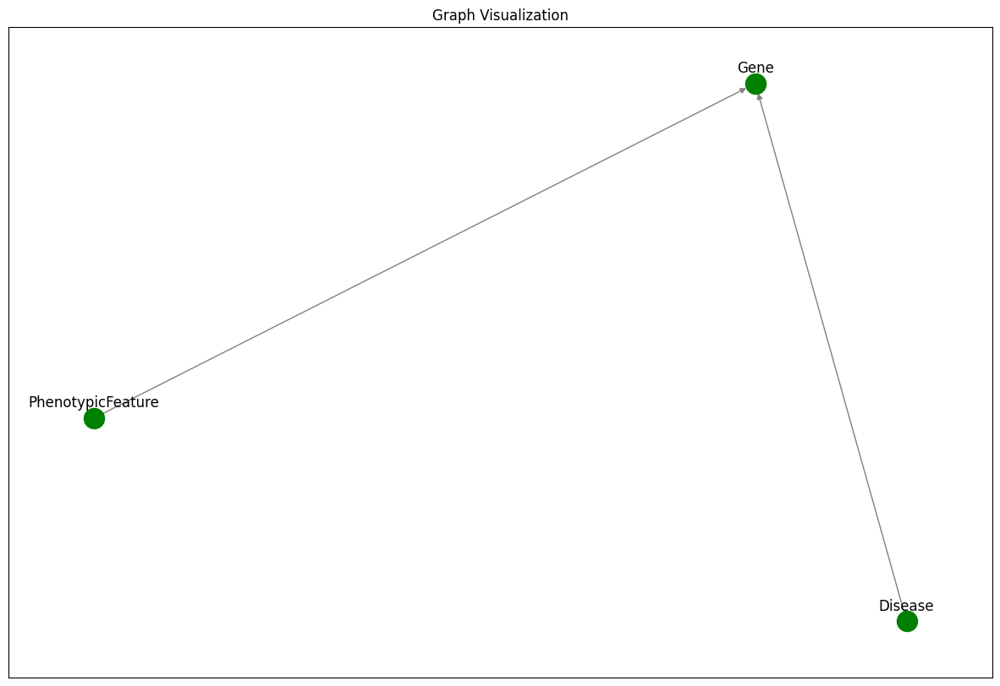

In [123]:
subject="Cre"
object="DiseaseOrPhenotypicFeature"
test_direct_edge(subject, object)

Disease Gene


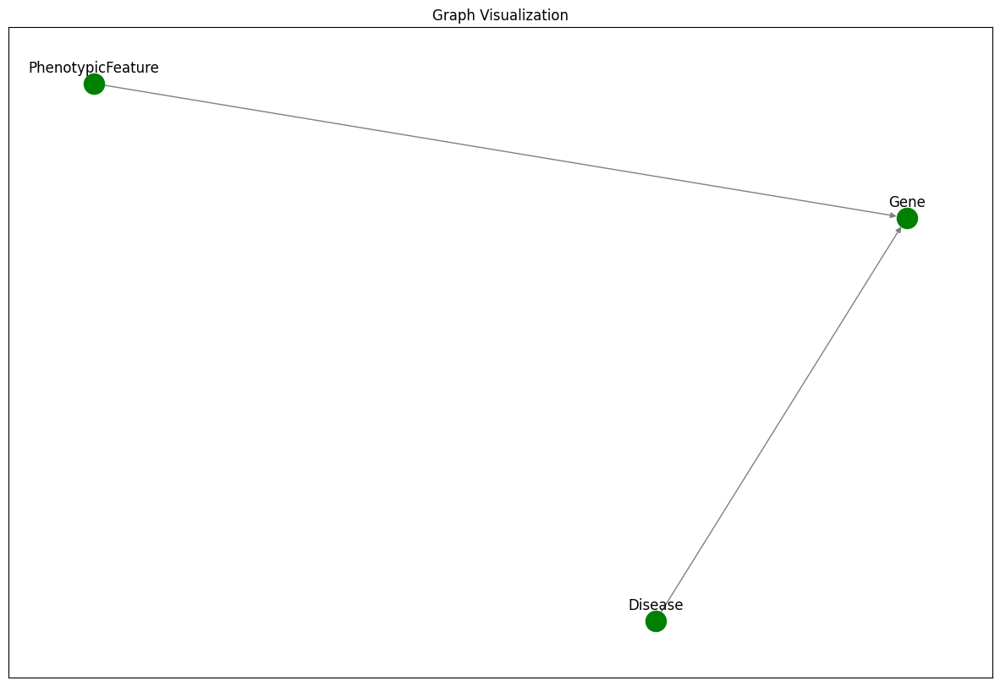

AssertionError: Expected a direct edge between Disease and Gene to be True, but got True

In [124]:
subject="Disease"
object="Gene"
test_direct_edge(subject, object)

---

### B. Cases with longer paths (2 or more nodes between subject and object).  


In [ ]:
def test_case02():
    from utils.metakg import path_finder
    # Mock the MetaKG data source
    # query filter to find BTE data only and with the specific predicate
    
    # query filter to find BTE data only
    query_data = {
        "query": {
            "bool": {
                "must": [
                    {"match": {"api.name": "BTE"}},
                    {"match": {"predicate": "condition_associated_with_gene"}}
                ]
            }
        }
    }
    subject="Disease"
    object="Gene"

    pf = path_finder.MetaKGPathFinder(query_data)
    # Fetch the paths between the given subject and object
    paths = pf.get_paths(subject, object)

    # Check for longer paths (2 or more nodes between subject and object)
    longer_paths = [path for path in paths if len(path["path"]) > 3]  # 3 because including subject and object

for path in longer_paths:
        # Ensure each path starts with the subject and ends with the object
        assert path["path"][0] == subject, f"Path does not start with the subject: {path}"
        assert path["path"][-1] == object, f"Path does not end with the object: {path}"


In [ ]:
test_case02()


---

## Evaluate Path Validity:

For each returned path:

A. Check if the path really starts with the subject and ends with the object.  
B. Check if all consecutive pairs in the path represent edges in the original graph.  
C. Validate the edge data (predicate and API) against the mock data or expectations.  

### A. Check if the path really starts with the subject and ends with the object.  


In [ ]:
def test_case03():
    from utils.metakg import path_finder
    # Mock the MetaKG data source
    # query filter to find BTE data only and with the specific predicate
    
    # query filter to find BTE data only
    query_data = {
        'q': 'api.name:BTE'
    }
    subject="ComplexMolecularMixture"
    object="DiseaseOrPhenotypicFeature"
    pf = path_finder.MetaKGPathFinder(query_data)
    # Fetch the paths between the given subject and object
    paths = pf.get_paths(subject, object)

    # Check for longer paths (2 or more nodes between subject and object)
    longer_paths = [path for path in paths if len(path["path"]) > 3]  # 3 because including subject and object

    for path in longer_paths:
        # Ensure each path starts with the subject and ends with the object
        assert path["path"][0] == subject, f"Path does not start with the subject: {path}"
        assert path["path"][-1] == object, f"Path does not end with the object: {path}"


In [ ]:
test_case03()

### B. Check if all consecutive pairs in the path represent edges in the original graph.  


In [ ]:
def validation_test02():
    from utils.metakg import path_finder

    # query filter to find BTE data only
    query_data = {
        'q': 'api.name:BTE'
    }
    subject="ComplexMolecularMixture"
    object="DiseaseOrPhenotypicFeature"
    # Initialize the pathfinder
    pf = path_finder.MetaKGPathFinder(query_data)

    # Fetch the paths between the given subject and object
    paths = pf.get_paths(subject, object)

    # Check for longer paths (2 or more nodes between subject and object)
    longer_paths = [path for path in paths if len(path["path"]) > 3]  # 3 because including subject and object

    for path in longer_paths:
        # Check that all consecutive node pairs in the path are edges in the graph
        for i in range(len(path["path"]) - 1):
            assert (path["path"][i], path["path"][i + 1]) in pf.G.edges, f"Edge {path['path'][i], path['path'][i+1]} does not exist in the original graph."


In [ ]:
validation_test02()

### C. Validate the edge data (predicate and API) against the mock data or expectations.  

In [ ]:
def validation_test03():
    from utils.metakg import path_finder


    # query filter to find BTE data only
    query_data = {
        "query": {
            "bool": {
                "must": [
                    {"match": {"api.name": "BTE"}},
                    {"match": {"predicate": "condition_associated_with_gene"}}
                ]
            }
        }
    }
    subject="Disease"
    object="Gene"
    
    # Load the expected data from the JSON file
    with open("validation_test03_es_index_data.json", "r") as infile:
        test_data_list = json.load(infile)

    # Convert list into the desired format for test_edge_data if necessary
    test_edge_data = {}
    for data in test_data_list:
        edge_key = f"{data['_source']['subject']}-{data['_source']['object']}"
        if edge_key not in test_edge_data:
            test_edge_data[edge_key] = []
        test_edge_data[edge_key].append({"predicate": data["_source"]["predicate"], "api": data["_source"]["api"]})

    # Initialize the pathfinder
    pf = path_finder.MetaKGPathFinder(query_data)

    # Fetch the paths between the given subject and object
    paths = pf.get_paths(subject, object)

    # Check for longer paths (2 or more nodes between subject and object)
    longer_paths = [path for path in paths if len(path["path"]) > 3]  # 3 because including subject and object

    for path in longer_paths:
        for i in range(len(path["path"]) - 1):
            #Validate edge data against mock data or expectations
            edge_key = f"{path['path'][i]}-{path['path'][i+1]}"
            actual_edge_data = pf.predicates.get(edge_key)
            expected_edge_data = test_edge_data.get(edge_key)

            assert actual_edge_data == expected_edge_data, f"Edge data mismatch for {edge_key}. Expected {expected_edge_data}, but got {actual_edge_data}."


In [ ]:
validation_test03()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/elasticsearch/connection/base.py:200: ElasticsearchWarning: Elasticsearch built-in security features are not enabled. Without authentication, your cluster could be accessible to anyone. See https://www.elastic.co/guide/en/elasticsearch/reference/7.17/security-minimal-setup.html to enable security.
  warnings.warn(message, category=ElasticsearchWarning)


---

### Edge Cases:

Don't forget potential edge cases:

A. What if there are multiple edges (with different predicates/APIs) between the same pair of nodes?  
B. How does the method handle self-loops or cycles?  

### A. What if there are multiple edges (with different predicates/APIs) between the same pair of nodes?  


In [ ]:
def edge_test01():
    from utils.metakg import path_finder
    
    # query filter to find BTE data only
    query_data = {
        'q': 'api.name:BTE'
    }
    subject="ComplexMolecularMixture"
    object="DiseaseOrPhenotypicFeature"
    pf = path_finder.MetaKGPathFinder(query_data)
    # Fetch the paths between the given subject and object
    paths = pf.get_paths(subject, object)

    # Check for longer paths (2 or more nodes between subject and object)
    longer_paths = [path for path in paths if len(path["path"]) > 3]  # 3 because including subject and object
    all_predicates = [edge['predicate'] for path in longer_paths for edge in path['edges']]

    # Check if the required predicates are in the fetched paths
    required_predicates = ["ameliorates", "treats"]
    for predicate in required_predicates:
        assert predicate in all_predicates, f"Predicate '{predicate}' not found in paths."

In [ ]:
edge_test01()

 ### B.How does the method handle self-loops or cycles?  


### 1. **Ignoring Self-loops**: In the context of the `all_simple_paths` function, a simple path cannot contain loops, which includes self-loops. So, if you're looking for simple paths between two distinct nodes, any self-loops encountered on intermediate nodes are simply ignored. This means that the path won't traverse through the self-loop even if it exists.

### 2. **Same Source and Target**: If you use the `all_simple_paths` function to find paths between a node and itself (i.e., source and target are the same node), then self-loops on that particular node are considered. In this case, two paths are returned: one with the self-loop and one without.


In [ ]:
import networkx as nx


In [ ]:
self_loop_nodes = [u for u, v in nx.selfloop_edges(G)]


In [ ]:
self_loop_nodes

['SmallMolecule',
 'PopulationOfIndividualOrganisms',
 'PhysiologicalProcess',
 'Procedure',
 'ChemicalEntity',
 'ClinicalAttribute',
 'Annotation',
 'Publication',
 'ComplexMolecularMixture',
 'BiologicalProcess',
 'MolecularMixture',
 'Drug',
 'Disease',
 'PhenotypicFeature',
 'ChemicalExposure',
 'EnvironmentalExposure',
 'ClinicalIntervention',
 'InformationContentEntity',
 'Activity',
 'Protein',
 'Gene',
 'AnatomicalEntity',
 'Cell',
 'CellularComponent',
 'GrossAnatomicalStructure',
 'MolecularActivity',
 'Polypeptide',
 'PathologicalProcess',
 'ClinicalFinding',
 'Pathway',
 'OrganismTaxon',
 'GeneFamily']

In [ ]:
self_loop_path = pf.get_paths(subject="SmallMolecule",object="SmallMolecule")

In [ ]:
self_loop_path

[]

In [ ]:
import networkx as nx

# Create a directed graph
G = nx.DiGraph()

# Add some edges including a self-loop on node 1
G.add_edges_from([(0, 1), (1, 2), (1, 1)])

# All simple paths from 0 to 2
paths_0_to_2 = list(nx.all_simple_paths(G, 0, 2))
print(paths_0_to_2)  # Expected: [[0, 1, 2]]

# All simple paths from 1 to 1
paths_1_to_1 = list(nx.all_simple_paths(G, 1, 1))
print(paths_1_to_1)  # Expected: [[1, 1], [1]]


[[0, 1, 2]]
[]


### Confirm returns all paths

In [ ]:
len(paths)

29063

In [ ]:
paths[0]['path']

['ComplexMolecularMixture',
 'SmallMolecule',
 'PopulationOfIndividualOrganisms',
 'Disease',
 'Drug',
 'DiseaseOrPhenotypicFeature']

In [ ]:
total_ct = 0
for i in range(1, 6):
    paths = pf.get_paths(subject, object, i)
    total_ct =+ len([path for path in paths if len(path['path']) == i+1])
    print(i, len(paths), total_ct)

1 1 1
2 5 4
3 83 78
4 1582 1499
5 29063 27481


In [ ]:
len(paths)

29063

In [ ]:
p2 = [path for path in paths if len(path['path']) == 3]
p3 = [path for path in paths if len(path['path']) == 4]
p4 = [path for path in paths if len(path['path']) == 5]
p5 = [path for path in paths if len(path['path']) == 6]


In [ ]:
print(len(p2), len(p3), len(p4), len(p5))

4 78 1499 27481


In [ ]:
print(len(p2) + len(p3) + len(p4)+ len(p5))

29062


---

### Build Data Files

In [ ]:
from controller.metakg import MetaKG
from model import ConsolidatedMetaKGDoc
index = ConsolidatedMetaKGDoc.Index.name


In [ ]:
documents=[]

query_data = {
        "query": {
            "bool": {
                "must": [
                    {"match": {"api.name": "BTE"}},
                    {"match": {"predicate": "condition_associated_with_gene"}}
                ]
            }
        }
    }
subject="Disease"
object="Gene"
for doc in MetaKG.get_all_via_scan(size=1000, query_data=query_data, index=index): 
    documents.append(doc)
# Save the list to a JSON file
with open("validation_test03_es_index_data.json", "w") as outfile:
    json.dump(documents, outfile, indent=4)

In [ ]:
# import requests
# import json

# # The URL endpoint
# url = "http://localhost:8000/api/metakg/consolidated"

# # The query parameters
# params = {
#     "q": "api.name:BTE",
#     "predicate": "condition_associated_with_gene"
# }

# # Make the GET request
# response = requests.get(url, params=params)

# # Check if the response status code is 200 (OK)
# if response.status_code == 200:
#     data = response.json()

#     # Write to a JSON file
#     with open("validation_test03.json", "w") as outfile:
#         json.dump(data, outfile, indent=4)
# else:
#     print(f"Failed to fetch data. HTTP Status code: {response.status_code}")





---

---